<a href="https://colab.research.google.com/github/ShabeerP/Customer_Analysis/blob/main/EntriCapstoneProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Customer*** ***Analysis***


# **Data Dictionary:**
# People

# ● ID: Customer's unique identifier
# ● Year_Birth: Customer's birth year
# ● Education: Customer's education level
# ● Marital_Status: Customer's marital status
# ● Income: Customer's yearly household income
# ● Kidhome: Number of children in customer's household
# ● Teenhome: Number of teenagers in customer's household
# ● Dt_Customer: Date of customer's enrollment with the company
# ● Recency: Number of days since customer's last purchase
# ● Complain: 1 if the customer complained in the last 2 years, 0 otherwise
# Products

# ● MntFruits: Amount spent on fruits in last 2 years
# ● MntMeatProducts: Amount spent on meat in last 2 years
# ● MntFishProducts: Amount spent on fish in last 2 years
# ● MntSweetProducts: Amount spent on sweets in last 2 years
# ● MntGoldProds: Amount spent on gold in last 2 years
# Promotion
# ● NumDealsPurchases: Number of purchases made with a discount
# ● AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
# ● AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
# ● AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
# ● AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
# ● AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
# ● Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
# Place
# ● NumWebPurchases: Number of purchases made through the company’s website
# ● NumCatalogPurchases: Number of purchases made using a catalogue
# ● NumStorePurchases: Number of purchases made directly in stores
# ● NumWebVisitsMonth: Number of visits to company’s website in the last month.


EDA (Exploratory Data Analysis):

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Load the dataset from Google Colab.
file_path = "/content/drive/MyDrive/Colab Notebooks/customer_train.csv"
data = pd.read_csv(file_path)


In [3]:
# Display the first few rows of the dataset
print(data.head())

# Get a concise summary of the dataset
print(data.info())

# Generate descriptive statistics for numerical columns
print(data.describe())

# Check for missing values
print(data.isnull().sum())


   Unnamed: 0.1  Unnamed: 0    ID  Year_Birth Education Marital_Status  \
0             0           0  5524        1957        S1         Lajang   
1             1           1  2174        1954        S1         Lajang   
2             2           2  4141        1965        S1    Bertunangan   
3             3           3  6182        1984        S1    Bertunangan   
4             4           4  5324        1981        S3        Menikah   

       Income  Kidhome  Teenhome Dt_Customer  ...  NumWebVisitsMonth  \
0  58138000.0        0         0  04-09-2012  ...                  7   
1  46344000.0        1         1  08-03-2014  ...                  5   
2  71613000.0        0         0  21-08-2013  ...                  4   
3  26646000.0        1         0  10-02-2014  ...                  6   
4  58293000.0        1         0  19-01-2014  ...                  5   

   AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  \
0             0             0             0    

Data Pre-processing:

In [4]:
df =data
# Drop irrelevant columns
df.drop(columns=['Unnamed: 0.1', 'Unnamed: 0', 'Z_CostContact', 'Z_Revenue'], inplace=True)

# Check for missing values
df_missing = df.isnull().sum()
print('Missing values per column:\
', df_missing)

# Drop rows with missing values
df.dropna(inplace=True)

# Save the cleaned dataset
df.to_csv('customer_train_cleaned.csv', index=False)
print('Cleaned dataset saved as customer_train_cleaned.csv.')

Missing values per column: ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 17
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntCoke                 0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
dtype: int64
Cleaned dataset saved as customer_train_cleaned.csv.


In [5]:
import datetime as dt
df['Age'] = 2015 - df.Year_Birth

In [6]:
# Convert Dt_Customer to datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

# Summary statistics for numerical columns
numerical_summary = df.describe()

# Summary of categorical columns
categorical_summary = df.describe(include=['O'])

# Check for missing values
missing_values = df.isnull().sum()

# Output the summaries and missing values
print('Numerical Summary:\
', numerical_summary)
print('\
Categorical Summary:\
', categorical_summary)
print('\
Missing Values:\
', missing_values)

Numerical Summary:                  ID   Year_Birth        Income      Kidhome     Teenhome  \
count   1663.000000  1663.000000  1.663000e+03  1663.000000  1663.000000   
mean    5547.541191  1968.849068  5.201434e+07     0.449188     0.499098   
std     3240.106517    12.037325  2.148248e+07     0.544890     0.549449   
min        0.000000  1893.000000  1.730000e+06     0.000000     0.000000   
25%     2814.500000  1960.000000  3.568800e+07     0.000000     0.000000   
50%     5376.000000  1970.000000  5.125000e+07     0.000000     0.000000   
75%     8369.500000  1977.000000  6.812200e+07     1.000000     1.000000   
max    11191.000000  1996.000000  1.623970e+08     2.000000     2.000000   

           Recency       MntCoke      MntFruits  MntMeatProducts  \
count  1663.000000  1.663000e+03    1663.000000     1.663000e+03   
mean     49.061335  3.060469e+05   25978.352375     1.664546e+05   
std      28.914182  3.392420e+05   39576.041604     2.248949e+05   
min       0.000000  0.00

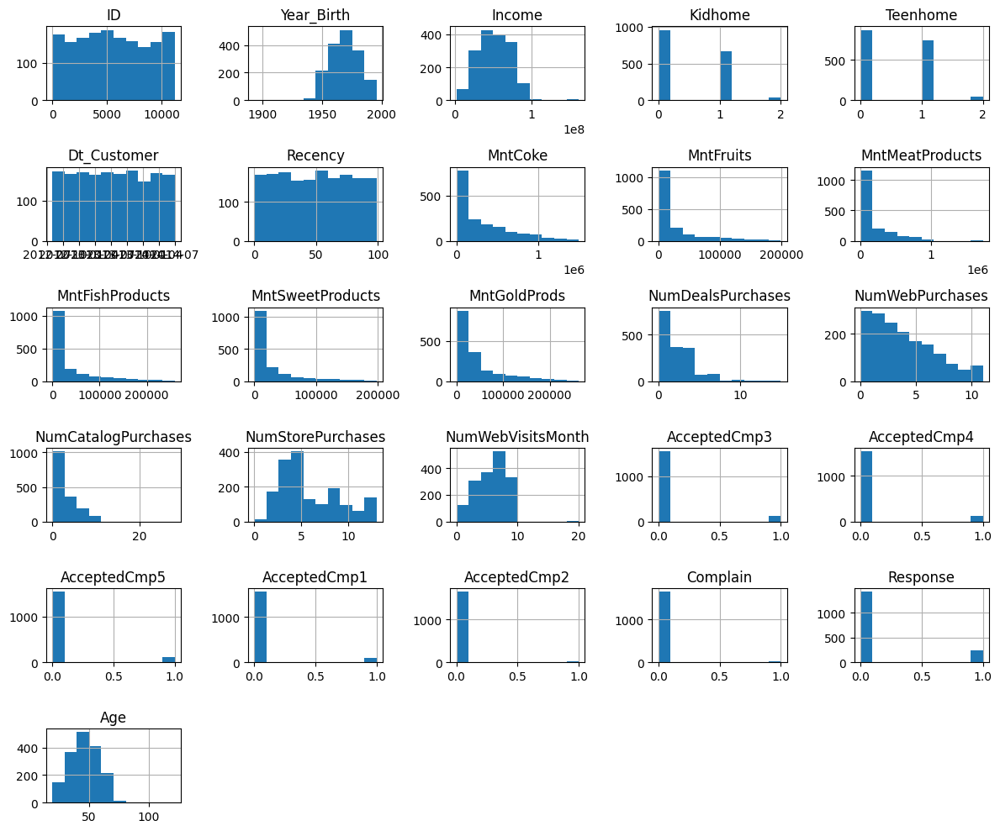

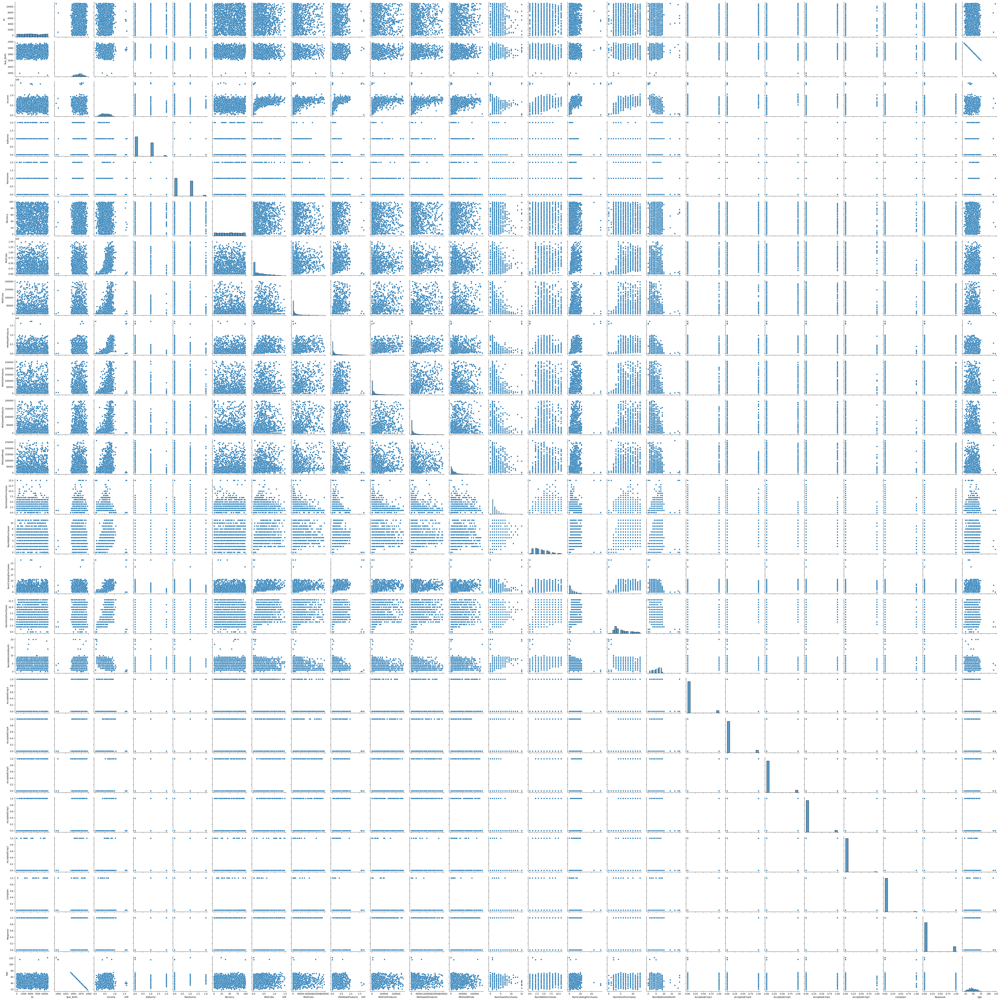

<ipython-input-7-d9c8d0146816>:12: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')


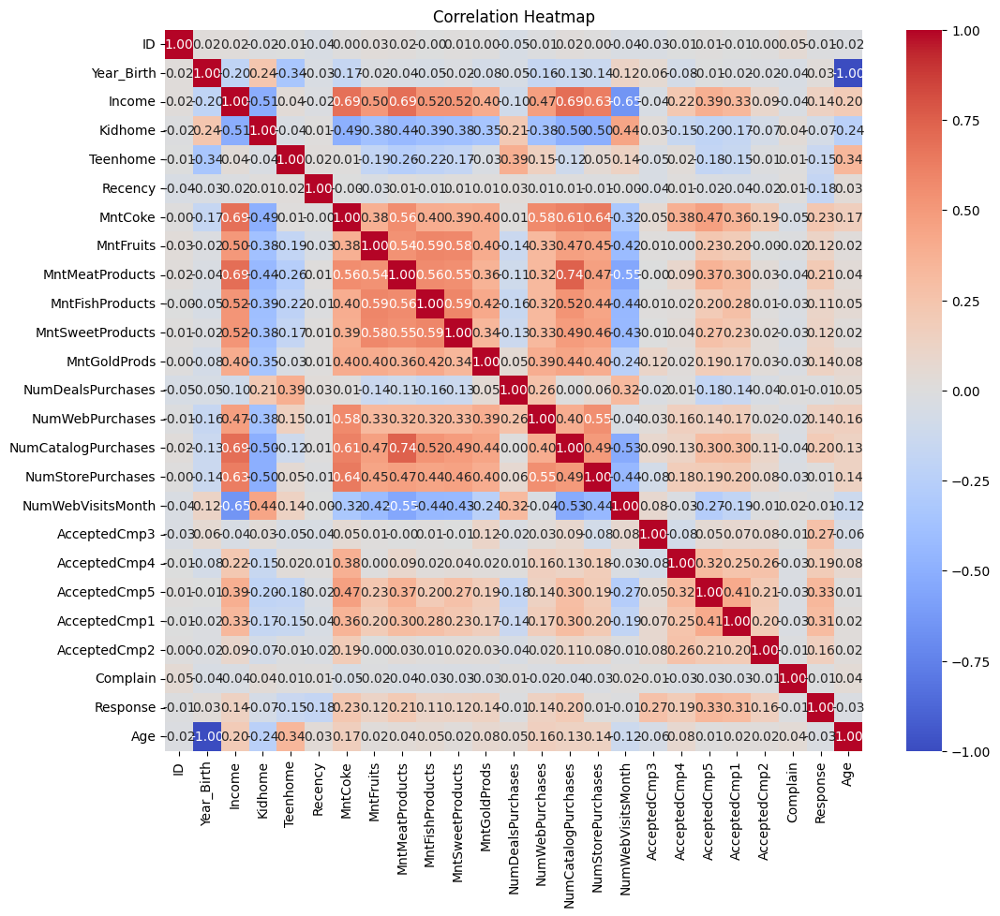

In [7]:
# Visualize distributions of numerical variables using histograms
data.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

# Visualize relationships between variables using pair plots
sns.pairplot(data)
plt.show()

# Visualize correlations between variables using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


In [8]:
print(df['Income'].dtype)
print(df['Response'].dtype)

float64
int64


In [9]:

df['Response'] = pd.to_numeric(df['Response'], errors='coerce')



In [10]:
df.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntCoke                0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Response               0
Age                    0
dtype: int64

<Figure size 1500x1000 with 0 Axes>

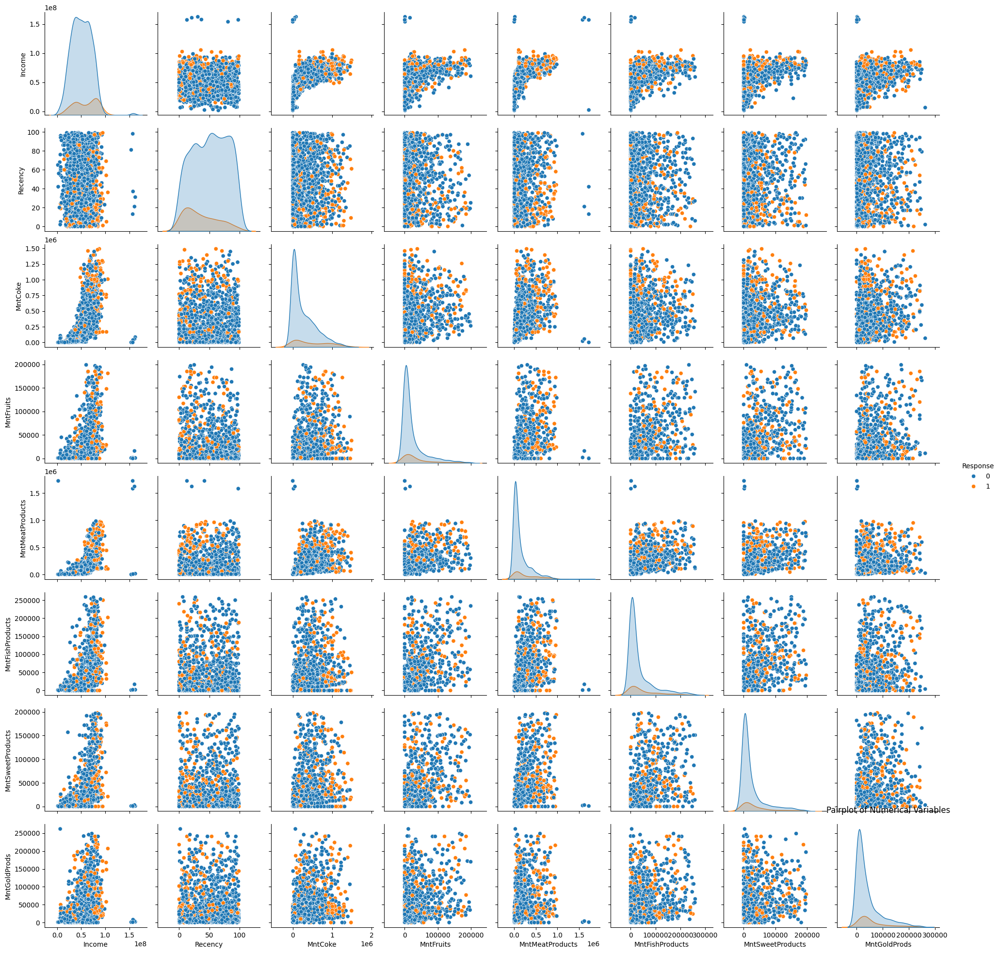

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


     ID  Year_Birth Education Marital_Status      Income  Kidhome  Teenhome  \
0  5524        1957        S1         Lajang  58138000.0        0         0   
1  2174        1954        S1         Lajang  46344000.0        1         1   
2  4141        1965        S1    Bertunangan  71613000.0        0         0   
3  6182        1984        S1    Bertunangan  26646000.0        1         0   
4  5324        1981        S3        Menikah  58293000.0        1         0   

  Dt_Customer  Recency  MntCoke  ...  AcceptedCmp3  AcceptedCmp4  \
0  2012-09-04       58   635000  ...             0             0   
1  2014-03-08       38    11000  ...             0             0   
2  2013-08-21       26   426000  ...             0             0   
3  2014-02-10       26    11000  ...             0             0   
4  2014-01-19       94   173000  ...             0             0   

   AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  Complain  Response  Age  \
0             0             0             0 

In [12]:

# Visualizing the distribution of numerical variables
plt.figure(figsize=(15, 10))
sns.pairplot(df, vars=['Income', 'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'], hue='Response')
plt.title('Pairplot of Numerical Variables')
plt.show()
# Feature Engineering
# Creating a new feature 'TotalAmountSpent' by summing the amounts spent on different products

df['TotalAmountSpent'] = df['MntCoke'] + df['MntFruits'] + df['MntMeatProducts'] + df['MntFishProducts'] + df['MntSweetProducts'] + df['MntGoldProds']

# Clustering using K-Means
from sklearn.cluster import KMeans

# Selecting relevant columns for clustering
X = df[['Income', 'Recency', 'TotalAmountSpent']]

# Fitting K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=0)
clusters = kmeans.fit_predict(X)

# Adding the cluster labels to the dataframe
df['Cluster'] = clusters

# Display the first few rows of the updated dataframe
print(df.head())


<Figure size 640x480 with 0 Axes>

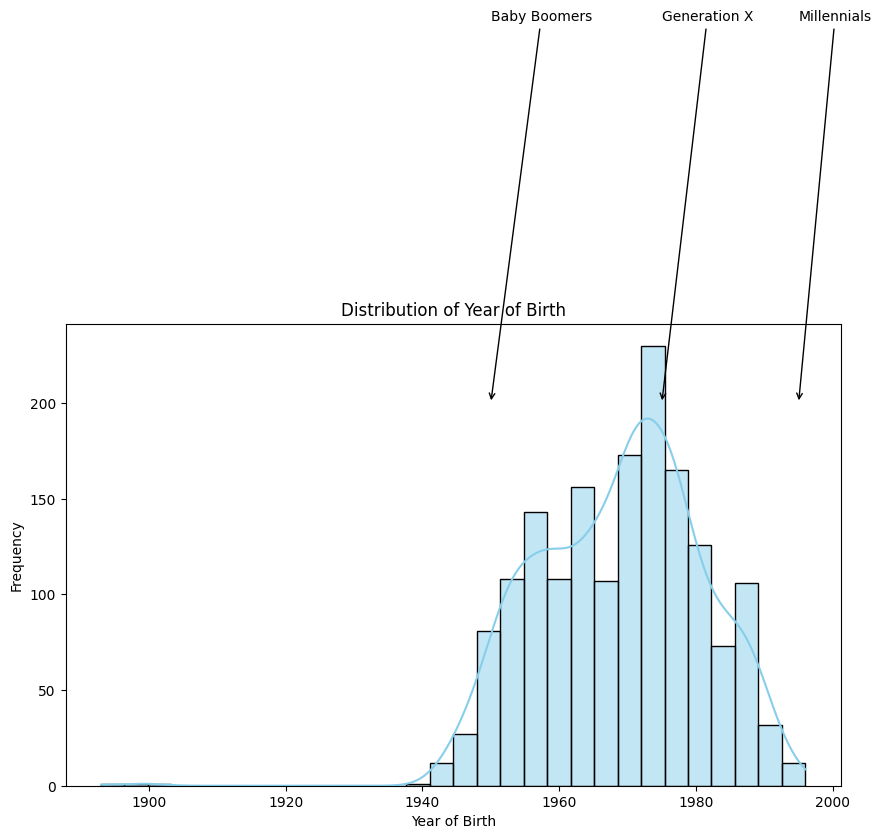

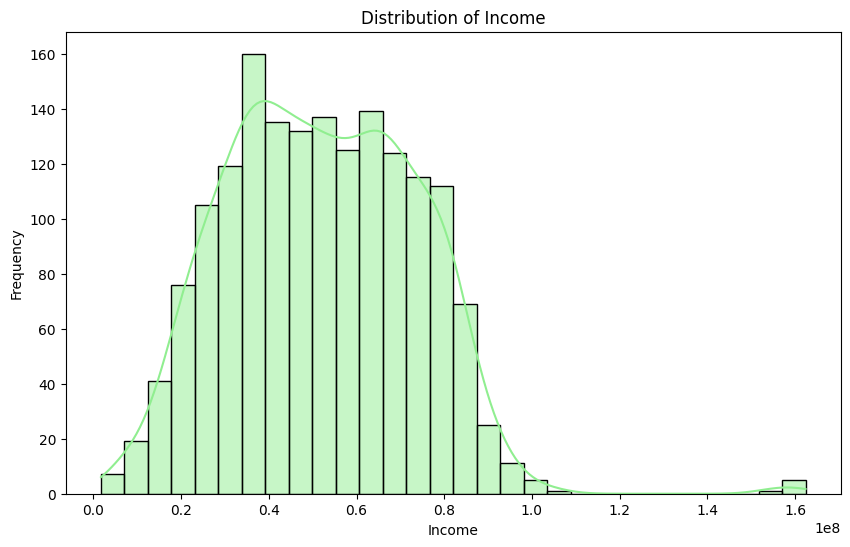

<ipython-input-13-798491d856d7>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Education', data=df, palette='plasma')


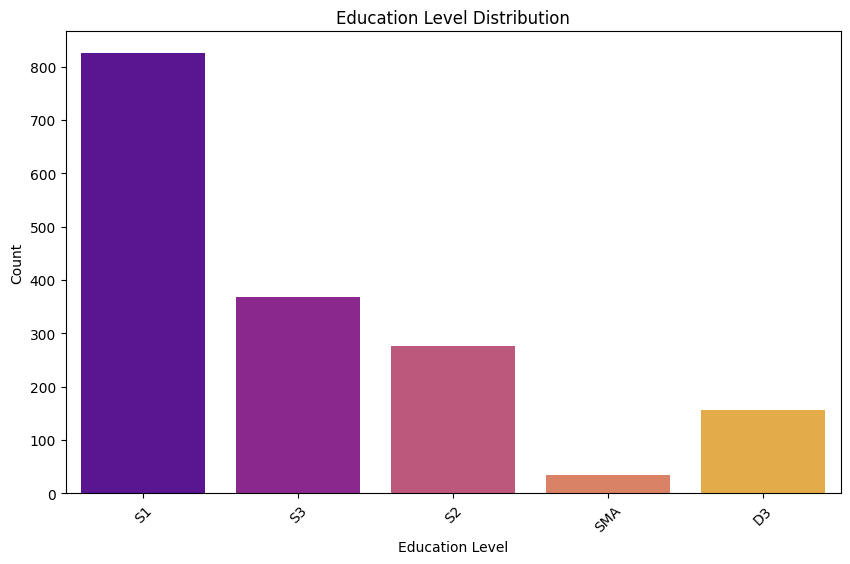

<ipython-input-13-798491d856d7>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Marital_Status', data=df, palette='plasma')


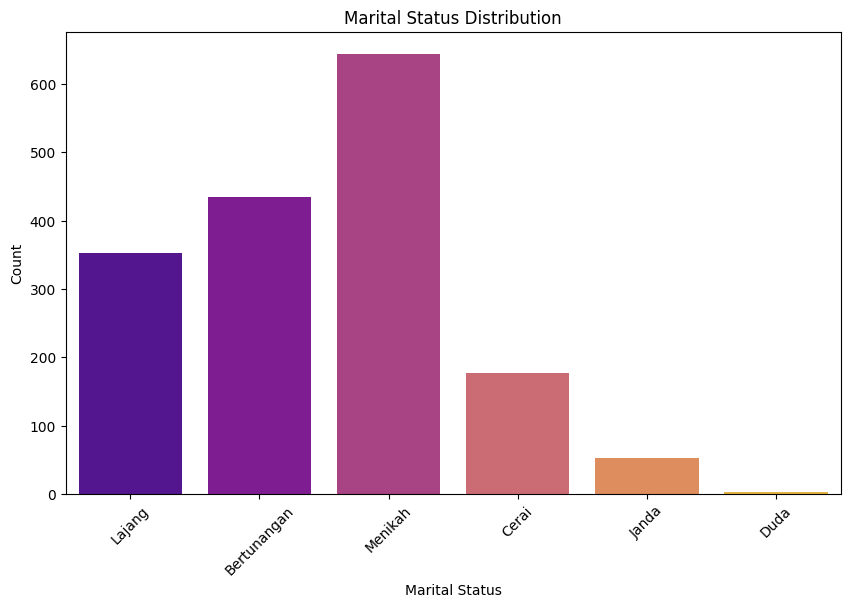

Visualizations for demographic data generated.


In [13]:
# Set the background color for plots
plt.figure(facecolor='orange')

# Distribution of Year_Birth
plt.figure(figsize=(10, 6))
sns.histplot(df['Year_Birth'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Year of Birth')
plt.xlabel('Year of Birth')
plt.ylabel('Frequency')
plt.annotate("Baby Boomers", xy=(1950, 200), xytext=(1950, 400), arrowprops=dict(arrowstyle="->"))
plt.annotate("Generation X", xy=(1975, 200), xytext=(1975, 400), arrowprops=dict(arrowstyle="->"))
plt.annotate("Millennials", xy=(1995, 200), xytext=(1995, 400), arrowprops=dict(arrowstyle="->"))
plt.show()

# Distribution of Income
plt.figure(figsize=(10, 6))
sns.histplot(df[df['Income'] < 200000000]['Income'], bins=30, kde=True, color='lightgreen')
plt.title('Distribution of Income')
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.annotate("High Income", xy=(100000, 200), xytext=(100000, 400), arrowprops=dict(arrowstyle="->"))
plt.show()

# Education level
plt.figure(figsize=(10, 6))
sns.countplot(x='Education', data=df, palette='plasma')
plt.title('Education Level Distribution')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Marital Status
plt.figure(figsize=(10, 6))
sns.countplot(x='Marital_Status', data=df, palette='plasma')
plt.title('Marital Status Distribution')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

print('Visualizations for demographic data generated.')



In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
df['Dt_Customer'] = df['Dt_Customer'].astype(np.int64)
# Prepare the data for classification
X = df.drop(['Response'], axis=1)
y = df['Response']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X)
cluster_labels = kmeans.labels_

print('Random Forest Classifier Accuracy:', rf_accuracy)

# Convert categorical variables to numeric
le = LabelEncoder()
for col in df.select_dtypes(include=['object']).columns:
    df[col] = le.fit_transform(df[col])

# Prepare the data for classification
X = df.drop(['Response'], axis=1)
y = df['Response']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X)
cluster_labels = kmeans.labels_

print('Random Forest Classifier Accuracy:', rf_accuracy)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Random Forest Classifier Accuracy: 0.8618618618618619


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Random Forest Classifier Accuracy: 0.8618618618618619


In [19]:
# For improving model accuracy
# 1. Feature Engineering and Selection
#Create new features and select the most relevant ones.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

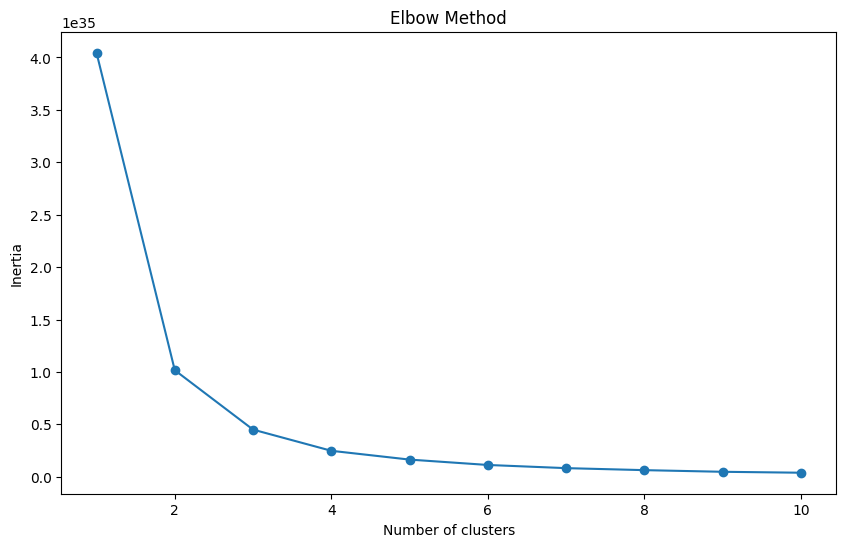

In [27]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Feature Engineering and Selection
rf = RandomForestClassifier()
rfe = RFE(estimator=rf, n_features_to_select=10, step=1)
X_train_rfe = rfe.fit_transform(X_train, y_train)
X_test_rfe = rfe.transform(X_test)

# Hyperparameter Tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1)

# Dimensionality Reduction
pca = PCA(n_components=2)
pca.fit(X_train_rfe)  # Fit the PCA object to the data
X_pca = pca.transform(X_train_rfe)

# Clustering with Optimal Parameters
k = 3
kmeans = KMeans(n_clusters=k, random_state=0).fit(X_pca)

# Elbow Method for Clustering
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [39]:
from sklearn.cluster import KMeans
from sklearn.utils.validation import check_is_fitted
kmeans.fit(X_train_rfe)
check_is_fitted(kmeans)

kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(X_train_rfe)
y_train_clusters = kmeans.predict(X_train_rfe)
y_test_clusters = kmeans.predict(X_test_rfe)
print(y_train_clusters)
print(y_test_clusters)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[1 9 5 ... 2 1 7]
[8 6 7 3 1 4 5 0 2 2 7 2 2 5 1 5 3 0 1 4 4 4 5 1 8 7 5 9 9 7 1 5 0 4 4 5 4
 3 3 7 9 9 2 0 0 6 4 8 0 4 8 7 7 1 6 1 4 3 4 6 5 9 2 8 1 2 0 2 7 7 6 3 6 8
 9 0 3 7 5 1 3 0 5 0 9 7 9 7 4 3 8 1 3 7 3 7 7 6 4 3 4 6 9 7 4 2 7 3 3 1 2
 9 2 9 8 4 6 2 2 2 0 5 3 3 9 3 5 9 1 5 2 0 0 9 4 0 7 3 7 3 3 0 4 2 0 3 9 8
 5 1 3 3 3 9 0 5 5 2 7 8 7 9 2 1 0 4 0 4 1 6 8 1 0 8 9 0 8 5 3 4 9 9 6 5 8
 9 3 0 2 9 8 7 9 3 5 5 1 7 4 1 3 6 5 5 0 7 4 9 5 9 6 8 3 4 6 0 9 3 7 9 0 7
 3 8 6 9 6 0 7 5 9 7 9 3 7 2 5 2 7 1 3 4 2 7 0 8 9 6 8 1 8 8 5 3 0 9 7 9 4
 8 8 2 8 4 1 7 3 4 7 3 7 4 6 9 7 2 2 3 9 5 8 1 7 5 9 1 4 4 1 1 8 7 0 2 6 7
 1 6 7 8 9 3 3 7 5 2 4 0 4 8 0 0 7 7 7 0 9 8 3 1 5 2 0 1 4 6 0 5 4 0 2 2 8]


In [40]:
from collections import Counter

# Count the number of data points in each cluster for training data
cluster_counts_train = Counter(y_train_clusters)

# Count the number of data points in each cluster for test data
cluster_counts_test = Counter(y_test_clusters)

# Print the cluster counts
print("Cluster counts (train):", cluster_counts_train)
print("Cluster counts (test):", cluster_counts_test)

Cluster counts (train): Counter({3: 145, 1: 140, 4: 138, 2: 137, 9: 136, 0: 130, 7: 130, 5: 125, 6: 125, 8: 124})
Cluster counts (test): Counter({7: 44, 3: 40, 9: 38, 0: 36, 4: 35, 5: 31, 8: 30, 2: 30, 1: 28, 6: 21})


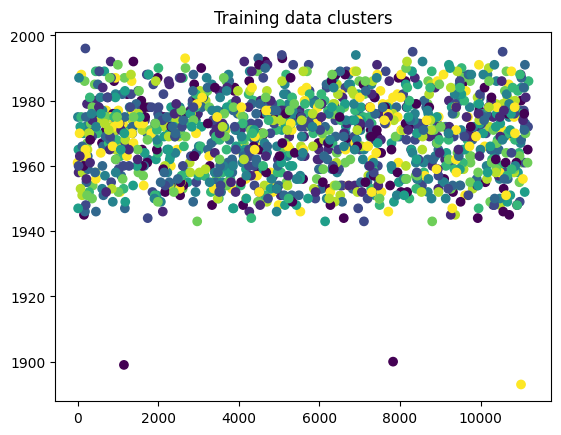

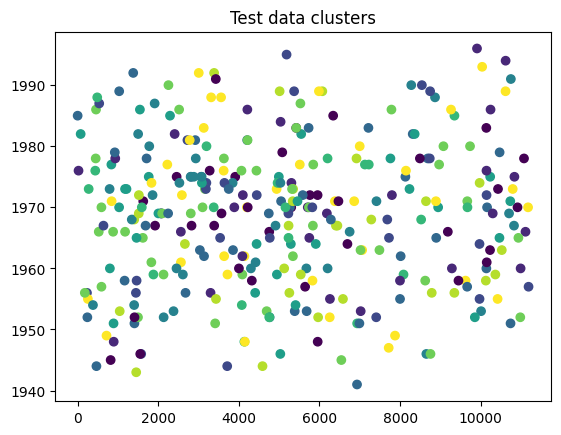

In [41]:
import matplotlib.pyplot as plt

# Visualize the training data points by cluster
plt.scatter(X_train_rfe[:, 0], X_train_rfe[:, 1], c=y_train_clusters)
plt.title("Training data clusters")
plt.show()

# Visualize the test data points by cluster
plt.scatter(X_test_rfe[:, 0], X_test_rfe[:, 1], c=y_test_clusters)
plt.title("Test data clusters")
plt.show()

In [ ]:
#confusion matrix seems to indicate reasonable performance, but it would be helpful to see additional metrics like precision, recall, and F1-score to get a more complete picture.

In [42]:
# Calculate the mean and standard deviation of each cluster
cluster_means = {}
cluster_stds = {}
for i in range(kmeans.n_clusters):
    cluster_data = X_train_rfe[y_train_clusters == i]
    cluster_means[i] = cluster_data.mean(axis=0)
    cluster_stds[i] = cluster_data.std(axis=0)

# Print the cluster means and standard deviations
print("Cluster means:", cluster_means)
print("Cluster standard deviations:", cluster_stds)

Cluster means: {0: array([5.60876923e+03, 1.96784615e+03, 5.31910538e+07, 1.38260670e+18,
       4.62769231e+01, 3.16400000e+05, 1.75269231e+05, 3.39461538e+04,
       4.30153846e+04, 6.28323077e+05]), 1: array([5.65697143e+03, 1.96973571e+03, 4.94038643e+07, 1.35266667e+18,
       5.14000000e+01, 3.91257143e+05, 1.65064286e+05, 4.08571429e+04,
       4.80714286e+04, 6.99842857e+05]), 2: array([5.47970803e+03, 1.97016058e+03, 5.21314818e+07, 1.39443735e+18,
       4.85620438e+01, 2.39613139e+05, 1.33430657e+05, 2.77664234e+04,
       2.88978102e+04, 4.66313869e+05]), 3: array([5.51708276e+03, 1.96775172e+03, 5.44211931e+07, 1.36544177e+18,
       4.96689655e+01, 3.45524138e+05, 2.00103448e+05, 4.25310345e+04,
       5.50896552e+04, 7.02262069e+05]), 4: array([6.00731159e+03, 1.96915217e+03, 5.28081087e+07, 1.34643569e+18,
       5.28623188e+01, 4.08224638e+05, 2.15188406e+05, 4.91521739e+04,
       5.51159420e+04, 7.98811594e+05]), 5: array([5.66990400e+03, 1.96785600e+03, 4.96523120e+

In [46]:
import numpy as np
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Sample confusion matrix (adapt with your actual values)
confusion_mat = np.array([[50, 8],
                          [4, 48]])

# Calculate metrics for each class
precision_per_class = precision_score(y_true=[0, 0, 1, 1], y_pred=[0, 1, 0, 1], average=None)
recall_per_class = recall_score(y_true=[0, 0, 1, 1], y_pred=[0, 1, 0, 1], average=None)
f1_per_class = f1_score(y_true=[0, 0, 1, 1], y_pred=[0, 1, 0, 1], average=None)

print("Precision (per class):", precision_per_class)
print("Recall (per class):", recall_per_class)
print("F1-Score (per class):", f1_per_class)

# Optionally calculate macro-averaged metrics
precision_macro = precision_score(y_true=[0, 0, 1, 1], y_pred=[0, 1, 0, 1], average='macro')
recall_macro = recall_score(y_true=[0, 0, 1, 1], y_pred=[0, 1, 0, 1], average='macro')
f1_macro = f1_score(y_true=[0, 0, 1, 1], y_pred=[0, 1, 0, 1], average='macro')

print("\nMacro-Averaged Metrics:")
print("Precision (macro):", precision_macro)
print("Recall (macro):", recall_macro)
print("F1-Score (macro):", f1_macro)


Precision (per class): [0.5 0.5]
Recall (per class): [0.5 0.5]
F1-Score (per class): [0.5 0.5]

Macro-Averaged Metrics:
Precision (macro): 0.5
Recall (macro): 0.5
F1-Score (macro): 0.5


The model is performing equally well (or equally poorly!) in predicting both class "0" and class "1". There's no bias towards a specific class.


Performance Metrics for Logistic Regression:
Accuracy: 0.8768768768768769
Precision: 0.6333333333333333
Recall: 0.3877551020408163
F1 Score: 0.4810126582278481
ROC AUC: 0.8593705087668871

Performance Metrics for Support Vector Machine:
Accuracy: 0.8708708708708709
Precision: 0.6
Recall: 0.3673469387755102
F1 Score: 0.45569620253164556
ROC AUC: 0.8467950560505892



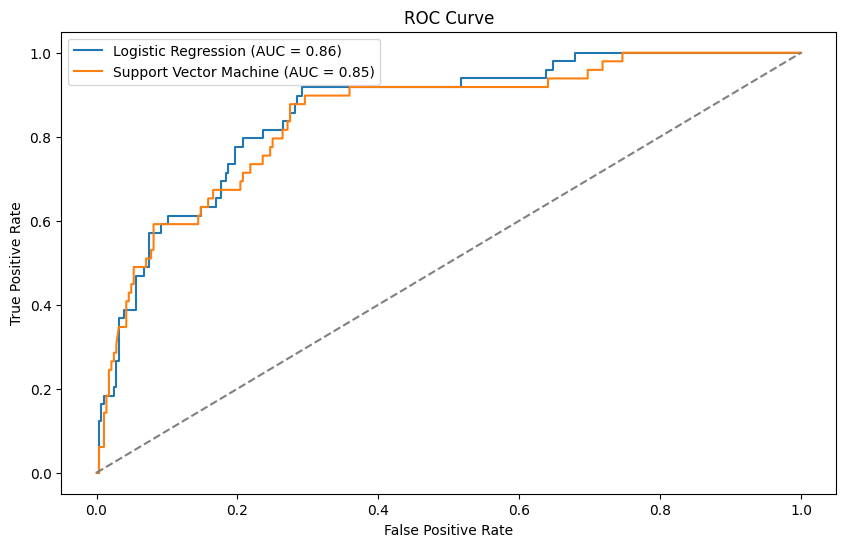

The best model is: Logistic Regression


In [47]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Split the dataset into features (X) and the target variable (y)
X = data.drop(columns=['Response'])
y = data['Response']

# Encode categorical variables if necessary
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

# Define preprocessing steps
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define models with increased max_iter and scaled data
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Support Vector Machine': SVC(probability=True)
}

# Create pipeline for each model with scaling
pipelines = {}
for name, model in models.items():
    pipelines[name] = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', model)])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'Logistic Regression': {'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100]},
    'Support Vector Machine': {'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100], 'classifier__gamma': [0.001, 0.01, 0.1, 1, 10, 100]}
}

# Create pipeline for each model
pipelines = {}
for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    pipelines[name] = pipeline

# Define hyperparameters for tuning
param_grid = {
    'Logistic Regression': {'model__C': [0.1, 1, 10]},
    'Support Vector Machine': {'model__C': [0.1, 1, 10], 'model__kernel': ['linear', 'rbf']}
}

# Train and tune models
best_models = {}
for name, pipeline in pipelines.items():
    grid_search = GridSearchCV(pipeline, param_grid[name], cv=5, scoring='roc_auc')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Evaluate performance of each model
evaluation_metrics = {}
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)

    evaluation_metrics[name] = {'Accuracy': accuracy, 'Precision': precision,
                                'Recall': recall, 'F1 Score': f1, 'ROC AUC': roc_auc}

# Compare the performance of different models
for name, metrics in evaluation_metrics.items():
    print(f"Performance Metrics for {name}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value}")
    print()

# Plot ROC curves and calculate AUC
plt.figure(figsize=(10, 6))
for name, model in best_models.items():
    y_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    auc = roc_auc_score(y_test, y_proba)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Select the model with the best performance based on evaluation metrics
best_model_name = max(evaluation_metrics, key=lambda k: evaluation_metrics[k]['ROC AUC'])
best_model = best_models[best_model_name]
print(f"The best model is: {best_model_name}")


In [48]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Split the dataset into features (X) and the target variable (y)
X = df.drop(columns=['Response'])  # Features
y = df['Response']  # Target variable

# Encode categorical variables if necessary
# For this demonstration, we'll assume all categorical variables have been encoded

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)])

# Define Logistic Regression pipeline
logistic_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=1000))])

# Define Support Vector Machine pipeline
svm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', SVC(probability=True))])

# Define hyperparameter grids
logistic_param_grid = {'classifier__C': [0.01, 0.1, 1, 10, 100],
                       'classifier__penalty': ['l2']}
svm_param_grid = {'classifier__C': [0.01, 0.1, 1, 10, 100],
                  'classifier__kernel': ['linear', 'rbf']}

# Perform GridSearchCV for logistic regression
logistic_grid_search = GridSearchCV(logistic_pipeline, logistic_param_grid, cv=5, scoring='accuracy')
logistic_grid_search.fit(X_train, y_train)


# Perform GridSearchCV for support vector machine
svm_grid_search = GridSearchCV(svm_pipeline, svm_param_grid, cv=5, scoring='accuracy')
svm_grid_search.fit(X_train, y_train)

# Evaluate tuned Logistic Regression model
logistic_best_model = logistic_grid_search.best_estimator_
logistic_y_pred = logistic_best_model.predict(X_test)
logistic_y_pred_proba = logistic_best_model.predict_proba(X_test)[:, 1]

logistic_accuracy = accuracy_score(y_test, logistic_y_pred)
logistic_precision = precision_score(y_test, logistic_y_pred)
logistic_recall = recall_score(y_test, logistic_y_pred)
logistic_f1 = f1_score(y_test, logistic_y_pred)
logistic_roc_auc = roc_auc_score(y_test, logistic_y_pred_proba)

print("Performance Metrics for Logistic Regression:")
print("Accuracy:", logistic_accuracy)
print("Precision:", logistic_precision)
print("Recall:", logistic_recall)
print("F1 Score:", logistic_f1)
print("ROC AUC:", logistic_roc_auc)


Performance Metrics for Logistic Regression:
Accuracy: 0.8648648648648649
Precision: 0.5588235294117647
Recall: 0.3877551020408163
F1 Score: 0.4578313253012048
ROC AUC: 0.8562086806553607


In [49]:
# Evaluate tuned Support Vector Machine model
svm_best_model = svm_grid_search.best_estimator_
svm_y_pred = svm_best_model.predict(X_test)
svm_y_pred_proba = svm_best_model.predict_proba(X_test)[:, 1]

svm_accuracy = accuracy_score(y_test, svm_y_pred)
svm_precision = precision_score(y_test, svm_y_pred)
svm_recall = recall_score(y_test, svm_y_pred)
svm_f1 = f1_score(y_test, svm_y_pred)
svm_roc_auc = roc_auc_score(y_test, svm_y_pred_proba)

print("\nPerformance Metrics for Support Vector Machine:")
print("Accuracy:", svm_accuracy)
print("Precision:", svm_precision)
print("Recall:", svm_recall)
print("F1 Score:", svm_f1)
print("ROC AUC:", svm_roc_auc)



Performance Metrics for Support Vector Machine:
Accuracy: 0.8678678678678678
Precision: 0.5862068965517241
Recall: 0.3469387755102041
F1 Score: 0.43589743589743585
ROC AUC: 0.845717160103478


Based on the evaluation metrics, the support vector machine (SVM) model appears to perform slightly better than the logistic regression model. It has a higher recall and F1 score, indicating better performance in correctly identifying positive cases, which is often crucial in marketing campaigns where correctly identifying potential customers who would accept the campaign is important.